<a href="https://colab.research.google.com/github/Omarsesa/Lablab/blob/main/Stable__Diffusion_Lambda_diffusers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Stable Diffusion Image Variations using lambda diffusers**

Generate variations on an input image using a fine-tuned version of Stable Diffision

**Short introduction to Stable Diffusion** 

Stable Diffusion is a text-to-image latent diffusion model created by the researchers and engineers from CompVis, Stability AI and LAION. It's trained on 512x512 images from a subset of the LAION-5B database.

 **About lamda defusers**

This version of Stable Diffusion has been fine tuned from CompVis/stable-diffusion-v1-3-original to accept CLIP image embedding rather than text embeddings. This allows the creation of "image variations" similar to DALLE-2 using Stable Diffusion. This version of the weights has been ported to huggingface Diffusers, to use this with the Diffusers library requires the Lambda Diffusers repo.

**lets get started**

**download the necessary files**


In [ ]:
%cd /content
!git clone https://github.com/LambdaLabsML/lambda-diffusers.git


# Commits on Oct 17, 2022
%cd /content/lambda-diffusers
!git checkout 4d4386e5d2ae667d18987b1a505a47efc643e9c9

/content
Cloning into 'lambda-diffusers'...
remote: Enumerating objects: 270, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 270 (delta 21), reused 21 (delta 9), pack-reused 224
Receiving objects: 100% (270/270), 12.27 MiB | 16.53 MiB/s, done.
Resolving deltas: 100% (112/112), done.
/content/lambda-diffusers
Note: checking out '4d4386e5d2ae667d18987b1a505a47efc643e9c9'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at 4d4386e update spaces link


**install the required libs**

In [ ]:
%cd /content/lambda-diffusers


# for lambda-diffusers
!pip install -r requirements.txt

/content/lambda-diffusers
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/, https://download.pytorch.org/whl/cu116
Obtaining file:///content/lambda-diffusers (from -r requirements.txt (line 9))
     |████████████████████████████████| 4.9 MB 31.0 MB/s 
     |████████████████████████████████| 53 kB 1.5 MB/s 
     |████████████████████████████████| 3.1 MB 53.8 MB/s 
     |████████████████████████████████| 153 kB 70.4 MB/s 
     |████████████████████████████████| 4.9 MB 62.8 MB/s 
     |████████████████████████████████| 13.5 MB 60.5 MB/s 
     |████████████████████████████████| 163 kB 72.6 MB/s 
     |████████████████████████████████| 6.6 MB 36.7 MB/s 
     |████████████████████████████████| 46 kB 3.3 MB/s 
     |████████████████████████████████| 86 kB 4.4 MB/s 
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
  Attempting uninstall: sciki

you might have to restart the run time

**import the required libs**

In [ ]:
%cd /content/lambda-diffusers

from pathlib import Path
from lambda_diffusers import StableDiffusionImageEmbedPipeline
from PIL import Image
import torch
from torch import autocast

from diffusers import StableDiffusionPipeline
from google.colab.patches import cv2_imshow
import cv2



device = "cuda" if torch.cuda.is_available() else "cpu"

/content/lambda-diffusers


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


Moving 0 files to the new cache system


0it [00:00, ?it/s]

# **Image to Image**

Load the pipeline.

In [ ]:
pipe = StableDiffusionImageEmbedPipeline.from_pretrained("lambdalabs/sd-image-variations-diffusers")
pipe = pipe.to(device)

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/1.38k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/7.47k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.62k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/493 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.65k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/260 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/748 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/527 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/335M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/316 [00:00<?, ?B/s]

**download the intial image**

--2022-11-08 15:03:25--  https://raw.githubusercontent.com/Omarsesa/Lablab/main/R.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1265254 (1.2M) [image/jpeg]
Saving to: ‘inputs/test_01.jpg’

inputs/test_01.jpg  100%[===================>]   1.21M  --.-KB/s    in 0.009s  

2022-11-08 15:03:27 (138 MB/s) - ‘inputs/test_01.jpg’ saved [1265254/1265254]



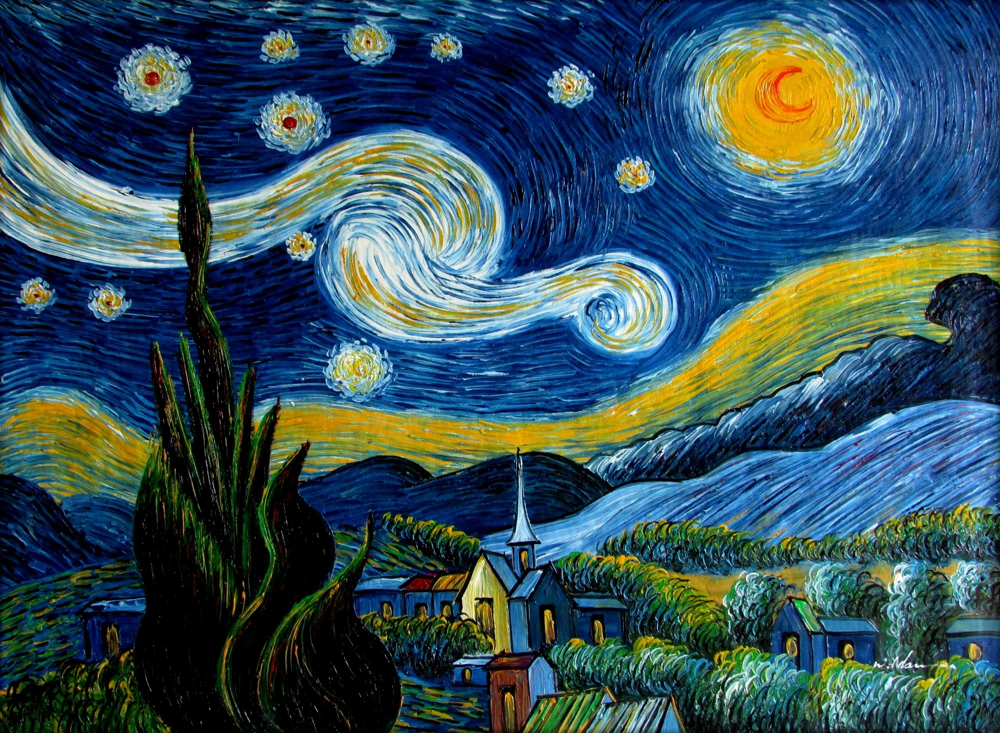

In [ ]:
!rm -rf outputs
!rm -rf inputs
!mkdir outputs inputs

!wget -c https://raw.githubusercontent.com/Omarsesa/Lablab/main/R.jpg \
      -O inputs/test_01.jpg
cv2_imshow(cv2.imread('inputs/test_01.jpg'))

**generate the images**

In [ ]:
input_img_path = "inputs/test_01.jpg"

im = Image.open(input_img_path)
num_samples = 2
image = pipe(num_samples*[im], guidance_scale=3.0)
image = image["sample"]

base_path = Path("outputs")
base_path.mkdir(exist_ok=True, parents=True)
for idx, im in enumerate(image):
  im.save(base_path/f"{idx:06}.jpg")

  0%|          | 0/51 [00:00<?, ?it/s]

1. we load the image
2. run the model
3. save the output images

**show the image**

here we resize the images then concat them horizontally and show them 

In [ ]:


def hconcat_resize_min(im_list, interpolation=cv2.INTER_CUBIC):
  h_min = min(im.shape[0] for im in im_list)
  im_list_resize = [cv2.resize(im, (int(im.shape[1] * h_min / im.shape[0]), h_min), interpolation=interpolation) for im in im_list]
  
  return cv2.hconcat(im_list_resize)

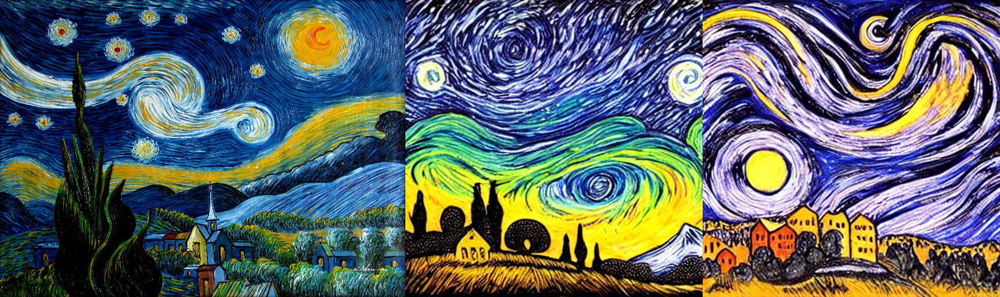

In [ ]:
kinput_cv_im = cv2.imread(input_img_path)

im_h = None
for i in range(num_samples):
  cv_im = cv2.imread(f"outputs/{i:06}.jpg")
  
  if i == 0:
    im_h = hconcat_resize_min([input_cv_im, cv_im])
  else:
    im_h = cv2.hconcat([im_h, cv_im])
    #pass

cv2_imshow(im_h)

As you can see here we have different variations of the intial image